In [1]:
#importing the necessary libraries
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import plotly.graph_objects as go
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, confusion_matrix
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, mean_squared_error, mean_absolute_error,auc
from sklearn.preprocessing import StandardScaler

In [2]:
import os
os.getcwd()

'C:\\Users\\johna'

In [3]:
#importing the dataset as data and viewing the first few rows of the dataset
data = pd.read_csv('Online Banking Fraud Dataset.csv')
data.head(10)

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1,PAYMENT,9839.64,C1231006815,170136.00,160296.36,M1979787155,0.0,0.00,0,0
1,1,PAYMENT,1864.28,C1666544295,21249.00,19384.72,M2044282225,0.0,0.00,0,0
2,1,TRANSFER,181.00,C1305486145,181.00,0.00,C553264065,0.0,0.00,1,0
3,1,CASH_OUT,181.00,C840083671,181.00,0.00,C38997010,21182.0,0.00,1,0
4,1,PAYMENT,11668.14,C2048537720,41554.00,29885.86,M1230701703,0.0,0.00,0,0
5,1,PAYMENT,7817.71,C90045638,53860.00,46042.29,M573487274,0.0,0.00,0,0
6,1,PAYMENT,7107.77,C154988899,183195.00,176087.23,M408069119,0.0,0.00,0,0
7,1,PAYMENT,7861.64,C1912850431,176087.23,168225.59,M633326333,0.0,0.00,0,0
8,1,PAYMENT,4024.36,C1265012928,2671.00,0.00,M1176932104,0.0,0.00,0,0
9,1,DEBIT,5337.77,C712410124,41720.00,36382.23,C195600860,41898.0,40348.79,0,0


**Columns description**
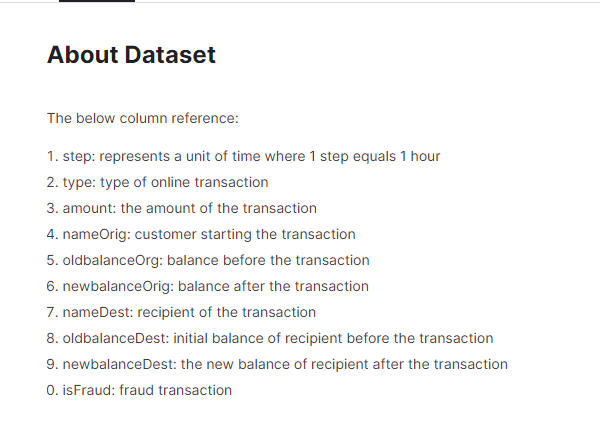

In [4]:
#looking at the last few rows of the dataset
data.tail(10)

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
6362610,742,TRANSFER,63416.99,C778071008,63416.99,0.0,C1812552860,0.00,0.00,1,0
6362611,742,CASH_OUT,63416.99,C994950684,63416.99,0.0,C1662241365,276433.18,339850.17,1,0
6362612,743,TRANSFER,1258818.82,C1531301470,1258818.82,0.0,C1470998563,0.00,0.00,1,0
6362613,743,CASH_OUT,1258818.82,C1436118706,1258818.82,0.0,C1240760502,503464.50,1762283.33,1,0
6362614,743,TRANSFER,339682.13,C2013999242,339682.13,0.0,C1850423904,0.00,0.00,1,0
6362615,743,CASH_OUT,339682.13,C786484425,339682.13,0.0,C776919290,0.00,339682.13,1,0
6362616,743,TRANSFER,6311409.28,C1529008245,6311409.28,0.0,C1881841831,0.00,0.00,1,0
6362617,743,CASH_OUT,6311409.28,C1162922333,6311409.28,0.0,C1365125890,68488.84,6379898.11,1,0
6362618,743,TRANSFER,850002.52,C1685995037,850002.52,0.0,C2080388513,0.00,0.00,1,0
6362619,743,CASH_OUT,850002.52,C1280323807,850002.52,0.0,C873221189,6510099.11,7360101.63,1,0


In [5]:
# randomly sample 600000 rows from the dataset
data = data.sample(n=600000, random_state=42)

In [6]:
# Investigating to see if there are null values present
data.isnull().any()

step              False
type              False
amount            False
nameOrig          False
oldbalanceOrg     False
newbalanceOrig    False
nameDest          False
oldbalanceDest    False
newbalanceDest    False
isFraud           False
isFlaggedFraud    False
dtype: bool

In [7]:
#There are no null values present in any of the columns
#Printing the data types in each column shows that columns 'nameOrig' and columns 'nameDest' are not numeric fields and
#They will need some form of transformation if they are going to be included in the analysis
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 600000 entries, 3737323 to 215818
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   step            600000 non-null  int64  
 1   type            600000 non-null  object 
 2   amount          600000 non-null  float64
 3   nameOrig        600000 non-null  object 
 4   oldbalanceOrg   600000 non-null  float64
 5   newbalanceOrig  600000 non-null  float64
 6   nameDest        600000 non-null  object 
 7   oldbalanceDest  600000 non-null  float64
 8   newbalanceDest  600000 non-null  float64
 9   isFraud         600000 non-null  int64  
 10  isFlaggedFraud  600000 non-null  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 54.9+ MB


In [8]:
#Printing the summary statistics of the dataset
data.describe()

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
count,600000.000000,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,6.000000e+05,600000.000000,600000.000000
mean,243.554938,1.810948e+05,8.298214e+05,8.512176e+05,1.108386e+06,1.234302e+06,0.001267,0.000002
std,142.504800,6.162997e+05,2.879996e+06,2.916148e+06,3.412953e+06,3.702902e+06,0.035568,0.001291
min,1.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,156.000000,1.337245e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000
50%,239.000000,7.509097e+04,1.417162e+04,0.000000e+00,1.334155e+05,2.162842e+05,0.000000,0.000000
75%,335.000000,2.094622e+05,1.070595e+05,1.439193e+05,9.514710e+05,1.119947e+06,0.000000,0.000000
max,742.000000,6.933732e+07,3.791982e+07,3.795009e+07,3.279981e+08,3.284317e+08,1.000000,1.000000


**Spliting the data into training and testing data sets**

Now, we will split our data into train set and test set to prepare our data for two different phases of machine learning modeling: training and testing. Ideally, no information from the test data should be used to preprocess the training data or should be used to direct the training process of a machine learning model. Hence, we first split the data and then preprocess it.

In [9]:
# Import train_test_split
from sklearn.model_selection import train_test_split

# Split into train and test sets
data_train, data_test = train_test_split(data, test_size=0.2, random_state=42)

In [10]:
print('The shape of the train dataset is ', data_train.shape)
print('-'*60)
print('The shape of the testing dataset is ', data_test.shape)

The shape of the train dataset is  (480000, 11)
------------------------------------------------------------
The shape of the testing dataset is  (120000, 11)


In [11]:
combine = [data_train, data_test]

In [12]:
print(data['type'].value_counts())

type
CASH_OUT    210905
PAYMENT     202937
CASH_IN     131848
TRANSFER     50444
DEBIT         3866
Name: count, dtype: int64


In [13]:
#valuecount returns the total number of occurence in each category in the dataset
def valuecount(x):
    v = x.value_counts()
    return v

In [14]:
#returning type of transaction and total occcurence
valuecount(data['type'])

type
CASH_OUT    210905
PAYMENT     202937
CASH_IN     131848
TRANSFER     50444
DEBIT         3866
Name: count, dtype: int64

In [15]:
#making a new dataframe to be used for the plotly chart
counts = (data['type'].value_counts()) # returns the total count of each transactions
plt_types = pd.DataFrame({'Transaction Type':counts.index, 'count':counts.values}) #Parse into dataframe

#plotting the distribution of fraud transactions
# Defining input and values
labels = plt_types['Transaction Type']
values = plt_types['count']

# Create the pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.5)])

# Set the layout
fig.update_layout(title={'text':'<b>Distribution of Transactions Types<b>', 'y':0.95,'x':0.5, 'xanchor' : 'center', 
                         'yanchor':'top', 'font':{'size': 20}},legend_title={'text':'<b>Type<b>'}, width=500, height=500)

# Show the chart
#fig.show() getting error with python so downloading the chart instead
fig.write_html("chart.html")

In [16]:
#returning newbalanceDest and its distinct total occurence
print(valuecount(data.newbalanceDest))

newbalanceDest
0.00           229954
1412484.09          5
265092.36           5
7364724.84          5
18482735.85         4
                ...  
712313.16           1
3052221.69          1
2011808.94          1
1889389.65          1
578672.53           1
Name: count, Length: 365704, dtype: int64


In [17]:
#returning the isFraud with its total occurence
a = valuecount(data.isFraud)
print(a)

isFraud
0    599240
1       760
Name: count, dtype: int64


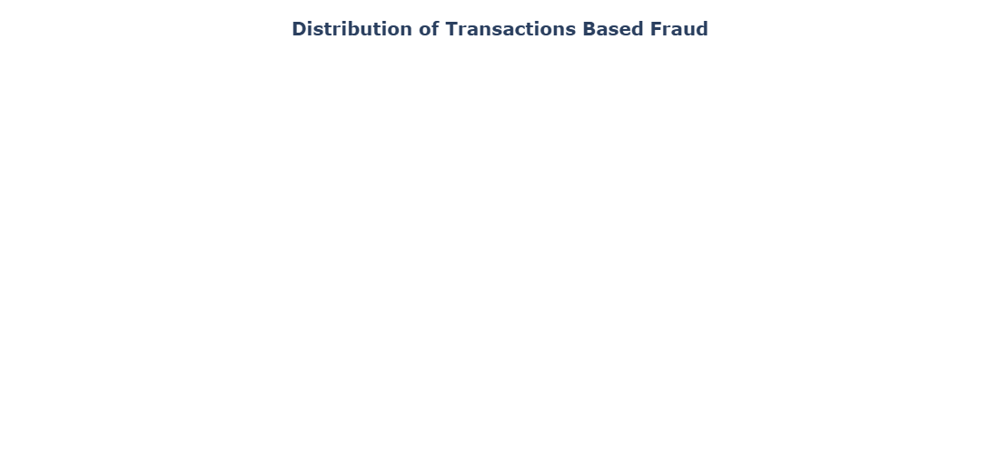

In [18]:
#making a new dataframe to be used for the plotly chart
counts = (data['isFraud'].value_counts()) # returns the total count of each transactions
plt_types = pd.DataFrame({'Fraud':counts.index, 'count':counts.values}) #Parse into dataframe

#plotting the distribution of fraud transactions
# Defining input and values
labels = plt_types['Fraud']
values = plt_types['count']

# Create the pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values)])

# Set the layout
fig.update_layout(title={'text':'<b>Distribution of Transactions Based Fraud<b>', 'y':0.95,'x':0.5, 'xanchor' : 'center', 
                         'yanchor':'top', 'font':{'size': 20}},legend_title={'text':'<b>Type<b>'}, width=500, height=500)

# Show the chart
fig.show()

In [19]:
#returning isFlaggedFraud and its total occurence
b = valuecount(data.isFlaggedFraud)
print(b)

isFlaggedFraud
0    599999
1         1
Name: count, dtype: int64


In [20]:
#how much of fradulent transaction was the bank able to detect
f = round(((16/8213) *100),3)
print('The bank was only able to detect or flag {} percent transactions as truely fraudulent.'.format(f))

The bank was only able to detect or flag 0.195 percent transactions as truely fraudulent.


## Converting payment type column to categorical numeical features

In [21]:
#mapping the transaction types into categorical numerical values
transaction_type_mapping ={'CASH_OUT':1, 'PAYMENT':2, 'CASH_IN':3, 'TRANSFER':4, 'DEBIT':5} 

for dataset in combine:
    dataset['type'] = dataset['type'].map(transaction_type_mapping)

print('The shape of the train dataset is ', data_train.shape)
print('-'*60)
print('The shape of the testing dataset is ', data_test.shape)

The shape of the train dataset is  (480000, 11)
------------------------------------------------------------
The shape of the testing dataset is  (120000, 11)


In [22]:
data_train.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
1105193,130,1,25705.95,C923194250,0.00,0.00,C1920398879,461804.12,487510.06,0,0
2154326,184,1,13904.03,C1241739690,0.00,0.00,C974093851,138054.97,151959.00,0,0
194592,13,2,2386.18,C1026021041,672144.26,669758.08,M2110246149,0.00,0.00,0,0
6289401,661,3,149016.56,C1031777149,7471300.56,7620317.12,C1449695641,1984759.57,1835743.01,0,0
4155028,303,2,2468.86,C279515454,25921.94,23453.08,M1924567040,0.00,0.00,0,0


**Hypothesis testing**

In [23]:
#Checking fraud rate with respect to the transaction type
data_train[['type','isFraud']].groupby(['type'], as_index = False).mean().sort_values(by = 'type', ascending = False)


,type,isFraud
4,5,0.000000
3,4,0.007905
2,3,0.000000
1,2,0.000000
0,1,0.001726


#Checking the fraud rate with respect to amount
data_train[['amount','isFraud']].groupby(['amount'], as_index = False).mean().sort_values(by = 'amount', ascending = False).head(100)

In [24]:
#Checking the fraud rate with respect to newbalanceOrig
data_train[['newbalanceOrig','isFraud']].groupby(['newbalanceOrig'], as_index = False).mean().sort_values(by = 'newbalanceOrig', ascending = False).head(100)

,newbalanceOrig,isFraud
207517,37950093.25,0.0
207516,34870813.36,0.0
207515,34809311.48,0.0
207514,34616322.78,0.0
207513,34602831.61,0.0
...,...,...
207422,30422956.05,0.0
207421,30419714.27,0.0
207420,30408566.06,0.0
207419,30379007.86,0.0


In [25]:
data_train.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
1105193,130,1,25705.95,C923194250,0.00,0.00,C1920398879,461804.12,487510.06,0,0
2154326,184,1,13904.03,C1241739690,0.00,0.00,C974093851,138054.97,151959.00,0,0
194592,13,2,2386.18,C1026021041,672144.26,669758.08,M2110246149,0.00,0.00,0,0
6289401,661,3,149016.56,C1031777149,7471300.56,7620317.12,C1449695641,1984759.57,1835743.01,0,0
4155028,303,2,2468.86,C279515454,25921.94,23453.08,M1924567040,0.00,0.00,0,0


**Based on this initial hypothesis testing columns 'isFlaggedFraud', 'nameOrig' and 'nameDest' does not say much about the fraud rate of a particular transaction so they can be dropped**

In [26]:
#dropping columns 'isFlaggedFraud', 'nameOrig' and 'nameDest' from the training and testing datasets
data_train = data_train.drop(columns=['isFlaggedFraud', 'nameOrig', 'nameDest'], inplace=False)
data_test = data_test.drop(columns=['isFlaggedFraud', 'nameOrig', 'nameDest'], inplace=False)

combine = [data_train, data_test]

In [27]:
data_train.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
1105193,130,1,25705.95,0.00,0.00,461804.12,487510.06,0
2154326,184,1,13904.03,0.00,0.00,138054.97,151959.00,0
194592,13,2,2386.18,672144.26,669758.08,0.00,0.00,0
6289401,661,3,149016.56,7471300.56,7620317.12,1984759.57,1835743.01,0
4155028,303,2,2468.86,25921.94,23453.08,0.00,0.00,0


# Visualizing the dataset

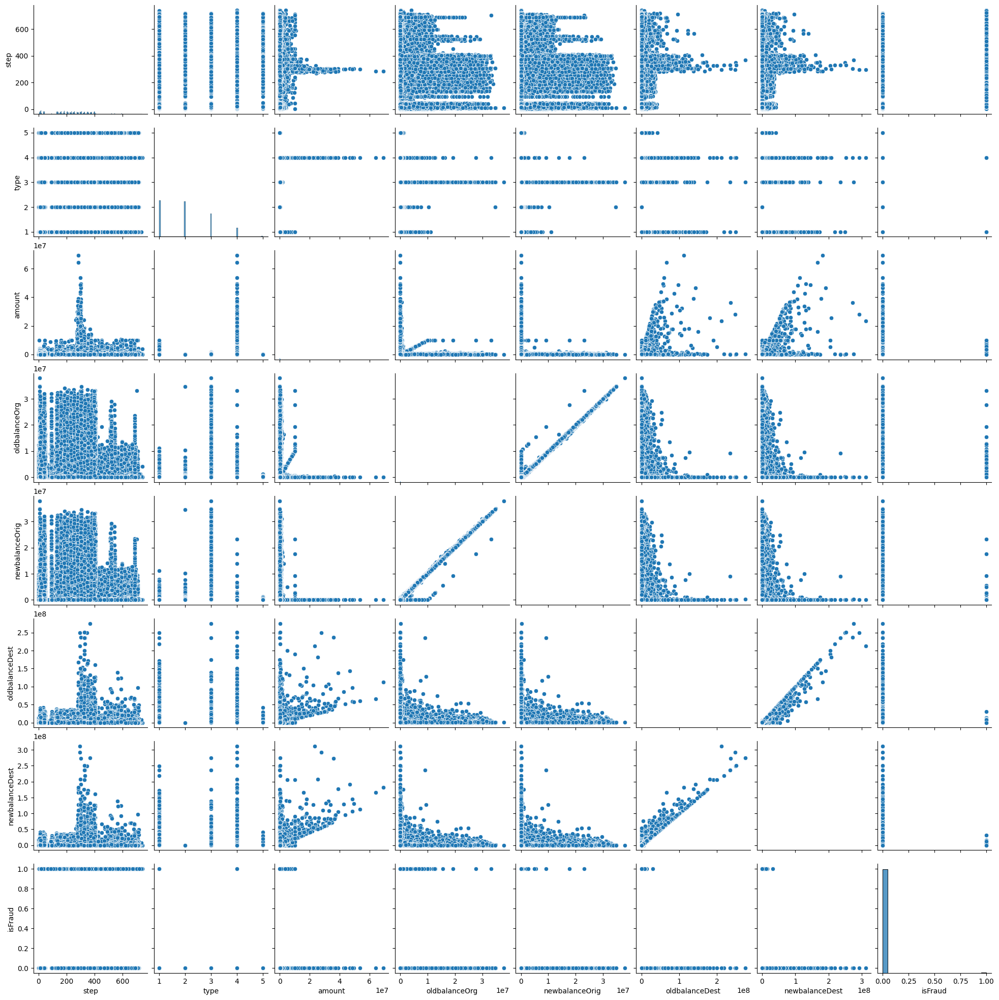

<Figure size 640x480 with 0 Axes>

In [28]:
#Use seaborn to plot pairwise scatter plot
sns.pairplot(data_train)
plt.show()
plt.savefig('pairwise_scatterplot.jpg')

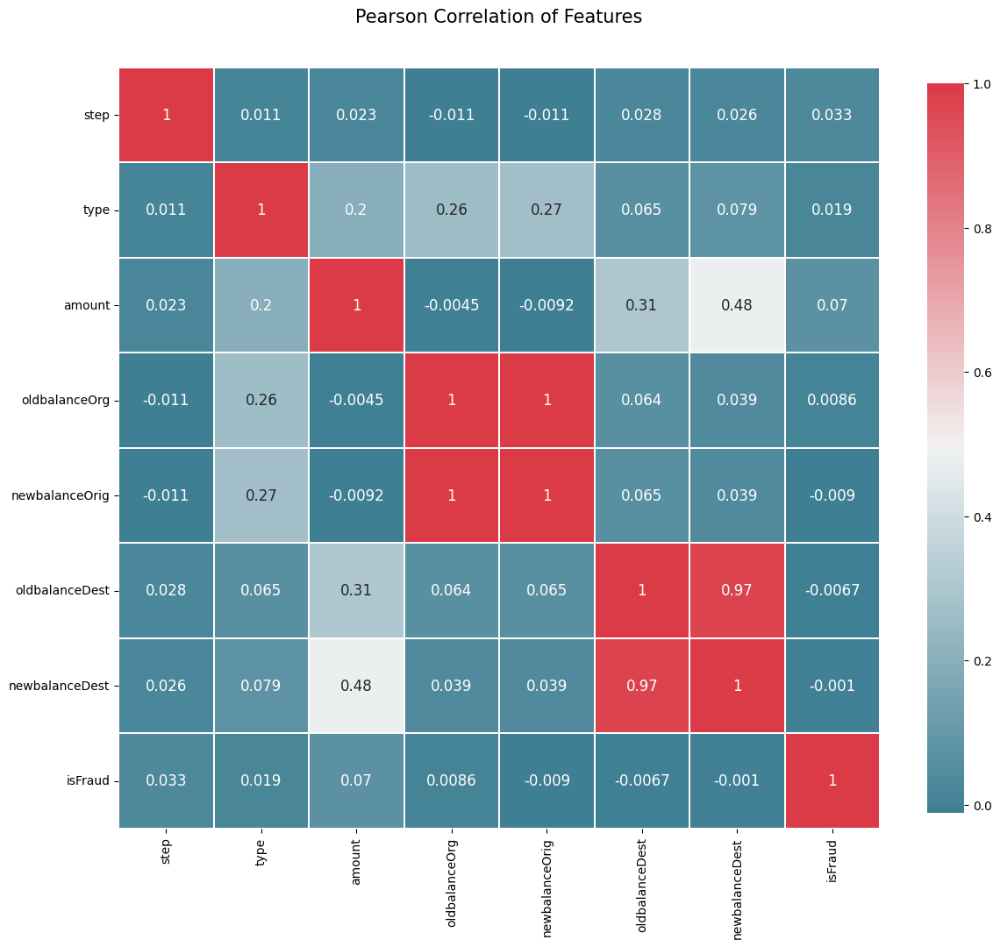

In [29]:
def correlation_heatmap(data):
    _ , ax = plt.subplots(figsize =(14, 12)) #Only ax is used in following code, we do not assign value to the other variable
    colormap = sns.diverging_palette(220, 10, as_cmap = True)
    
    sns.heatmap(
        data.corr(), 
        cmap = colormap,
        square=True, 
        cbar_kws={'shrink':.9 }, 
        ax=ax,
        annot=True, 
        linewidths=0.1,vmax=1.0, linecolor='white',
        annot_kws={'fontsize':12 }
    )
    
    plt.title('Pearson Correlation of Features', y=1.05, size=15)
    plt.show()
    
correlation_heatmap(data_train) #Input train_df to the function, and check the correlation of all variables

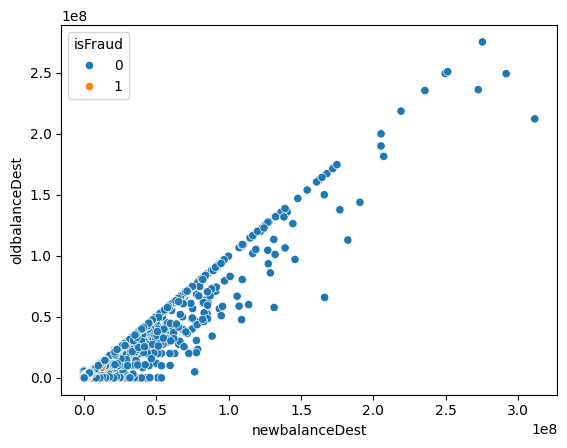

In [30]:
# Create scatter plot with 'newbalanceDest' on x-axis and 'oldbalanceDest' on y-axis, with 'isFraud' as hue variable
ax = sns.scatterplot(data=data_train, x="newbalanceDest", y="oldbalanceDest", hue="isFraud")

# Set x-axis to log scale
#ax.set(xscale="log")
#ax.set(yscale = "log")

# Show the plot
plt.show()


In [31]:
print('The shape of the train dataset is ', data_train.shape)
print('-'*60)
print('The shape of the testing dataset is ', data_test.shape)

The shape of the train dataset is  (480000, 8)
------------------------------------------------------------
The shape of the testing dataset is  (120000, 8)


In [32]:
# Splitting data_train and data_test into features and lables
X_train = data_train.drop('isFraud', axis = 1)
y_train = data_train['isFraud']
X_test = data_test.drop('isFraud', axis = 1)
y_test =  data_test['isFraud']

## Logistic Regression

In [33]:
# Initialize and fit logistic regression model
logreg = LogisticRegression(max_iter = 1000)
logreg.fit(X_train, y_train)

# Predict probabilities for train and test sets
y_train_prob = logreg.predict_proba(X_train)[:, 1]
y_test_prob = logreg.predict_proba(X_test)[:, 1]

# Predict classes for train and test sets
y_train_pred = logreg.predict(X_train)
y_test_pred = logreg.predict(X_test)

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

# Extract coefficients and intercept
coefficients = logreg.coef_
intercept = logreg.intercept_

# Print coefficients and intercept
print('Coefficients:', coefficients)
print('Intercept:', intercept)

Training accuracy: 0.9993041666666667
Testing accuracy: 0.9992833333333333
Coefficients: [[ 5.92648397e-03  3.95271727e-01 -1.54897873e-05  3.40063573e-05
  -4.18197707e-05  7.10319602e-06 -7.31807723e-06]]
Intercept: [-9.41343348]


In [34]:
#Confusion matrix and classification report
cm = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix:')
print(cm)
print('-'*60)
print("Classification report:\n", classification_report(y_test, y_test_pred))

Confusion Matrix:
[[119838     12]
 [    74     76]]
------------------------------------------------------------
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.86      0.51      0.64       150

    accuracy                           1.00    120000
   macro avg       0.93      0.75      0.82    120000
weighted avg       1.00      1.00      1.00    120000



Training ROC AUC: 0.9738658383827262
Testing ROC AUC: 0.9759653455708525


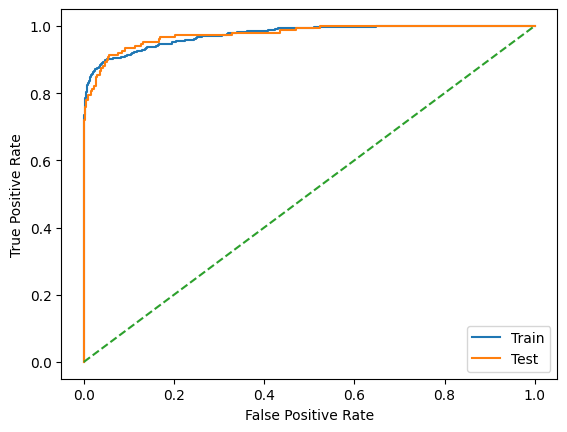

In [35]:
# Calculate ROC AUC for train and test sets
train_roc_auc = roc_auc_score(y_train, y_train_prob)
test_roc_auc = roc_auc_score(y_test, y_test_prob)
print('Training ROC AUC:', train_roc_auc)
print('Testing ROC AUC:', test_roc_auc)

# Plot ROC curve for train and test sets
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
plt.plot(fpr_train, tpr_train, label='Train')
plt.plot(fpr_test, tpr_test, label='Test')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

## **Hyperparameter Tuning**

C:\Users\johna\myenv\lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\johna\myenv\lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\johna\myenv\lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\johna\myenv\lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\johna\myenv\lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

C:\Users\johna\myenv\lib\site-packages\sklearn\linear_model\_sag.py:348: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



Best hyperparameters: {'solver': 'saga', 'penalty': 'l1', 'C': 100}
Training accuracy: 99.8729%
Testing accuracy: 99.8750%
Training ROC AUC: 0.41126178794841395
Testing ROC AUC: 0.42245868446669443


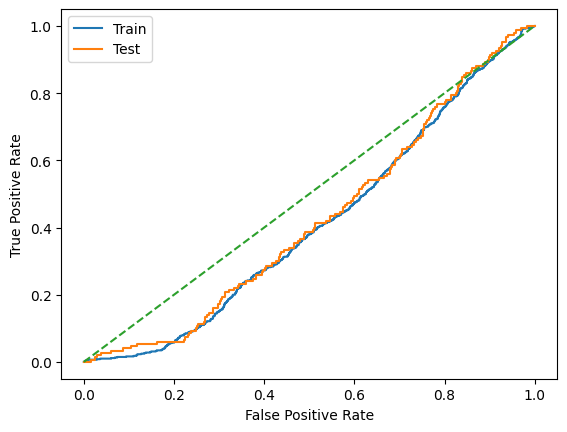

In [36]:
# Create the logistic regression model
log_reg = LogisticRegression(max_iter=1000)

# Define the hyperparameters to tune
kf =  KFold(n_splits = 5, shuffle =  True, random_state = 42)
hyperparameters = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['saga', 'liblinear'],
    'penalty': ['l1', 'l2'] # Add Lasso and Ridge regularization
}

# Use RandomizedSearchCV to find the best hyperparameters
random_search = RandomizedSearchCV(log_reg, hyperparameters, cv=kf, n_iter = 2)
random_search.fit(X_train, y_train)
best_log_reg = random_search.best_estimator_
print('Best hyperparameters:', random_search.best_params_)

# Predict probabilities for train and test sets
y_train_prob = best_log_reg.predict_proba(X_train)[:, 1]
y_test_prob = best_log_reg.predict_proba(X_test)[:, 1]

# Make predictions on training and testing sets
train_preds = best_log_reg.predict(X_train)
test_preds = best_log_reg.predict(X_test)

# Calculate accuracy scores
train_acc = accuracy_score(y_train, train_preds)
test_acc = accuracy_score(y_test, test_preds)
print("Training accuracy: {:.4f}%".format(train_acc*100))
print("Testing accuracy: {:.4f}%".format(test_acc*100))


# Calculate ROC AUC for train and test sets
train_roc_auc = roc_auc_score(y_train, y_train_prob)
test_roc_auc = roc_auc_score(y_test, y_test_prob)
print('Training ROC AUC:', train_roc_auc)
print('Testing ROC AUC:', test_roc_auc)

# Plot ROC curve for train and test sets
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
plt.plot(fpr_train, tpr_train, label='Train')
plt.plot(fpr_test, tpr_test, label='Test')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

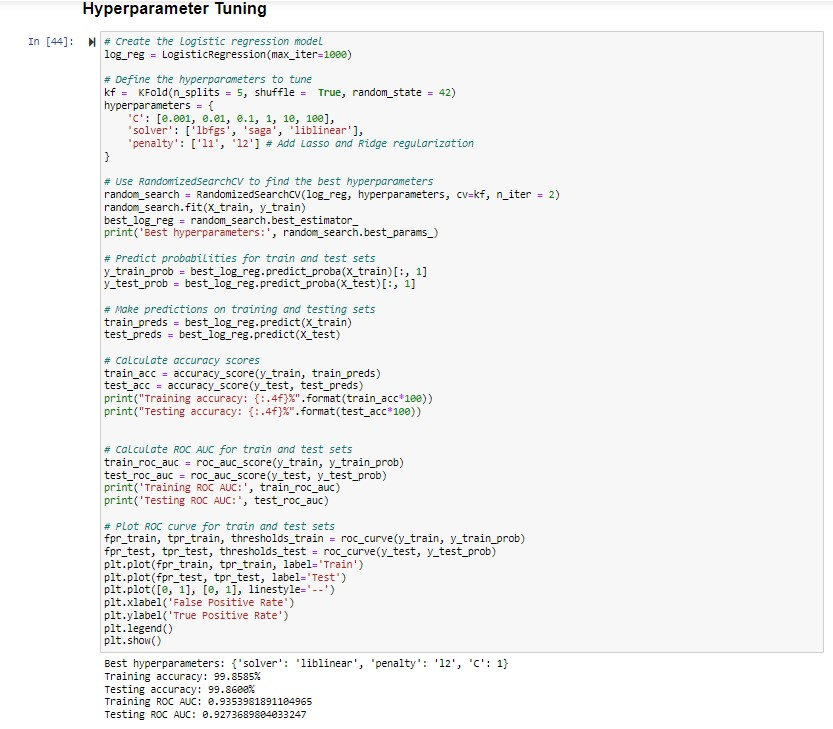

### **Final Logistic Regression Model OutPut**

Training accuracy: 0.9993041666666667
Testing accuracy: 0.9992833333333333
Coefficients: [[ 5.92477945e-03  3.96894245e-01 -1.51290996e-05  3.36114276e-05
  -4.14098173e-05  7.08559769e-06 -7.30068374e-06]]
Intercept: [-9.41839374]
Confusion Matrix:
[[119838     12]
 [    74     76]]
------------------------------------------------------------
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.86      0.51      0.64       150

    accuracy                           1.00    120000
   macro avg       0.93      0.75      0.82    120000
weighted avg       1.00      1.00      1.00    120000

Training ROC AUC: 0.9737453676615672
Testing ROC AUC: 0.9758460853845083


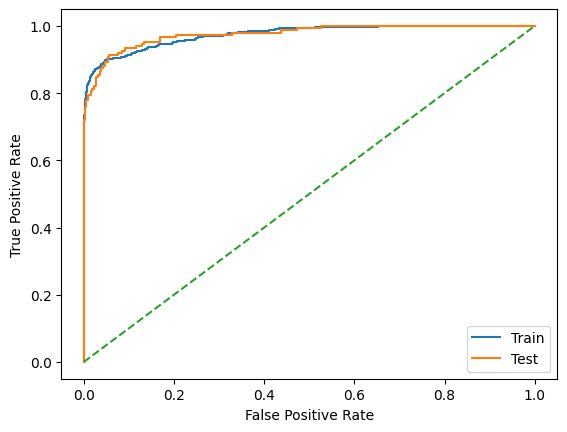

In [37]:
# Initialize and fit logistic regression model
logreg = LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 100, max_iter = 1000)
logreg.fit(X_train, y_train)

# Predict probabilities for train and test sets
y_train_prob = logreg.predict_proba(X_train)[:, 1]
y_test_prob = logreg.predict_proba(X_test)[:, 1]

# Predict classes for train and test sets
y_train_pred = logreg.predict(X_train)
y_test_pred = logreg.predict(X_test)

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

# Extract coefficients and intercept
coefficients = logreg.coef_
intercept = logreg.intercept_

# Print coefficients and intercept
print('Coefficients:', coefficients)
print('Intercept:', intercept)

#Confusion matrix and classification report
cm = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix:')
print(cm)
print('-'*60)
print("Classification report:\n", classification_report(y_test, y_test_pred))

# Calculate ROC AUC for train and test sets
train_roc_auc = roc_auc_score(y_train, y_train_prob)
test_roc_auc = roc_auc_score(y_test, y_test_prob)
print('Training ROC AUC:', train_roc_auc)
print('Testing ROC AUC:', test_roc_auc)

# Plot ROC curve for train and test sets
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
plt.plot(fpr_train, tpr_train, label='Train')
plt.plot(fpr_test, tpr_test, label='Test')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# **KNN**

In [38]:
import warnings
warnings.filterwarnings("ignore", message="^Unlike other reduction functions")

# Initialize and fit KNN model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

# Predict classes for train and test sets
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

Training accuracy: 0.9994520833333334
Testing accuracy: 0.99935


In [39]:
#Confusion matrix and classification report
cm = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix:')
print(cm)
print('-'*60)
print("Classification report:\n", classification_report(y_test, y_test_pred))

Confusion Matrix:
[[119837     13]
 [    65     85]]
------------------------------------------------------------
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.87      0.57      0.69       150

    accuracy                           1.00    120000
   macro avg       0.93      0.78      0.84    120000
weighted avg       1.00      1.00      1.00    120000



### **Hyperparameter Tuning**

In [40]:
import warnings
warnings.filterwarnings("ignore", message="^Unlike other reduction functions")

# Hyperparameter tuning with random searchCV

knn = KNeighborsClassifier()

#Define hyperparameters to tune
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
param_distributions = {'n_neighbors': np.arange(1, 21),
                       'weights': ['uniform', 'distance']}
rand_search = RandomizedSearchCV(knn, param_distributions, n_iter=2, cv=kf)
rand_search.fit(X_train, y_train)
print('Best hyperparameters:', rand_search.best_params_)


Best hyperparameters: {'weights': 'uniform', 'n_neighbors': np.int64(2)}


### Final KNN Model OutPut

In [41]:
import warnings
warnings.filterwarnings("ignore", message="^Unlike other reduction functions")

# Initialize and fit KNN model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(weights = 'distance', n_neighbors = 9)
knn.fit(X_train, y_train)

# Predict classes for train and test sets
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

#Confusion matrix and classification report
cm = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix:')
print(cm)
print('-'*60)
print("Classification report:\n", classification_report(y_test, y_test_pred))

Training accuracy: 1.0
Testing accuracy: 0.999375
Confusion Matrix:
[[119842      8]
 [    67     83]]
------------------------------------------------------------
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.91      0.55      0.69       150

    accuracy                           1.00    120000
   macro avg       0.96      0.78      0.84    120000
weighted avg       1.00      1.00      1.00    120000



# Decision Trees Classifier

Training accuracy: 1.0
Testing accuracy: 0.9994916666666667
Confusion matrix:
 [[119823     27]
 [    34    116]]
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.81      0.77      0.79       150

    accuracy                           1.00    120000
   macro avg       0.91      0.89      0.90    120000
weighted avg       1.00      1.00      1.00    120000

AUC: 0.8865540258656655


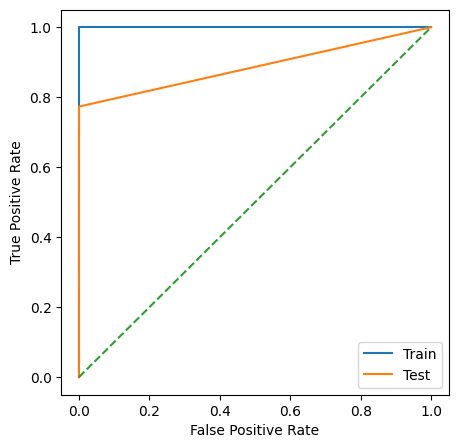

In [42]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=42)

# Train the model on the training set
clf.fit(X_train, y_train)

# Predict the classes of test set
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
y_train_prob = clf.predict_proba(X_train)[:,1]
y_test_prob = clf.predict_proba(X_test)[:,1]

#calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

# Generate classification report
cm = confusion_matrix(y_test, y_test_pred)
cr = classification_report(y_test, y_test_pred)
print('Confusion matrix:\n', cm)
print('Classification report:\n', cr)

# Calculate ROC and draw ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# Plot ROC curve for train and test sets
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
plt.figure(figsize=(5,5))
plt.plot(fpr_train, tpr_train, label='Train')
plt.plot(fpr_test, tpr_test, label='Test')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

## Hyperparameter Tuning

In [43]:
# Tune hyperparameters using random searchCV
kf = KFold(n_splits = 5, shuffle = True, random_state = 42)
param_dist = {'max_depth': [3, 5, 7, 10, None],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4]}
              
random_search = RandomizedSearchCV(clf, param_distributions=param_dist,
                                   n_iter=2, cv=kf)
random_search.fit(X_train, y_train)
print('Best hyperparameters:', random_search.best_params_)

# Calculate ROC and draw ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

Best hyperparameters: {'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 3}
AUC: 0.8865540258656655


### ***Final Model for DecisionTree***

Training accuracy: 0.999675
Testing accuracy: 0.9996083333333333
AUC: 0.9809943262411347
Confusion matrix:
 [[119847      3]
 [    44    106]]
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.97      0.71      0.82       150

    accuracy                           1.00    120000
   macro avg       0.99      0.85      0.91    120000
weighted avg       1.00      1.00      1.00    120000



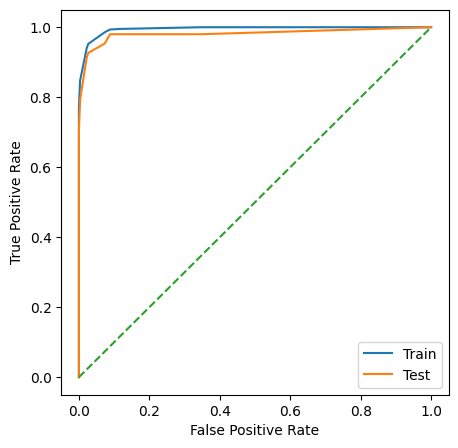

In [44]:
#Re-train the dataset with the best hyperparameters
clf = DecisionTreeClassifier(min_samples_split= 2, min_samples_leaf= 2, max_depth= 10)

# Train the model on the training set
clf.fit(X_train, y_train)

# Predict the classes of test set
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
y_train_prob = clf.predict_proba(X_train)[:,1]
y_test_prob = clf.predict_proba(X_test)[:,1]

#calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

# Calculate ROC and draw ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
roc_auc = auc(fpr, tpr)
print('AUC:', roc_auc)

# Generate classification report
cm = confusion_matrix(y_test, y_test_pred)
cr = classification_report(y_test, y_test_pred)
print('Confusion matrix:\n', cm)
print('Classification report:\n', cr)

# Plot ROC curve for train and test sets
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
plt.figure(figsize=(5,5))
plt.plot(fpr_train, tpr_train, label='Train')
plt.plot(fpr_test, tpr_test, label='Test')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

# **Testing The Optimal Models with oldbalanceOrg and newbalanceOrig**

In [45]:
X_train.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest
1105193,130,1,25705.95,0.00,0.00,461804.12,487510.06
2154326,184,1,13904.03,0.00,0.00,138054.97,151959.00
194592,13,2,2386.18,672144.26,669758.08,0.00,0.00
6289401,661,3,149016.56,7471300.56,7620317.12,1984759.57,1835743.01
4155028,303,2,2468.86,25921.94,23453.08,0.00,0.00


In [46]:
# Splitting data_train and data_test into features and lables
X_train = data_train[['newbalanceOrig','oldbalanceOrg']]
y_train = data_train['isFraud']
X_test = data_test[['newbalanceOrig','oldbalanceOrg']]
y_test =  data_test['isFraud']

In [47]:
X_test.shape

(120000, 2)

In [48]:
X_train.shape

(480000, 2)

# **Logistic Regression**

Training accuracy: 0.99910625
Testing accuracy: 0.9991333333333333
Coefficients: [[-1.38831105e-05  9.93070150e-06]]
Intercept: [-7.45347791]
Confusion Matrix:
[[119837     13]
 [    91     59]]
------------------------------------------------------------
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.82      0.39      0.53       150

    accuracy                           1.00    120000
   macro avg       0.91      0.70      0.77    120000
weighted avg       1.00      1.00      1.00    120000

Training ROC AUC: 0.9714183239697716
Testing ROC AUC: 0.9697086914198304


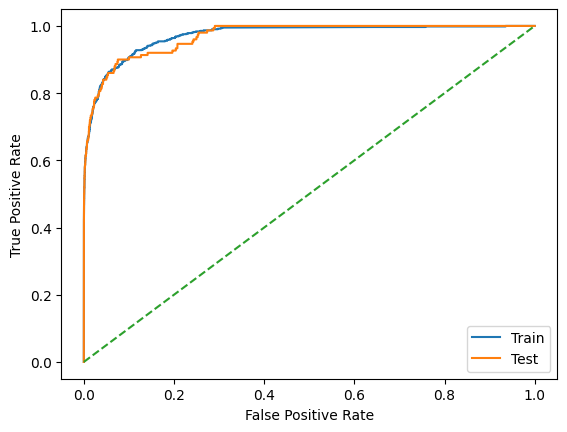

In [49]:
# Initialize and fit logistic regression model
logreg = LogisticRegression(max_iter = 1000)
logreg.fit(X_train, y_train)

# Predict probabilities for train and test sets
y_train_prob = logreg.predict_proba(X_train)[:, 1]
y_test_prob = logreg.predict_proba(X_test)[:, 1]

# Predict classes for train and test sets
y_train_pred = logreg.predict(X_train)
y_test_pred = logreg.predict(X_test)

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

# Extract coefficients and intercept
coefficients = logreg.coef_
intercept = logreg.intercept_

# Print coefficients and intercept
print('Coefficients:', coefficients)
print('Intercept:', intercept)

#Confusion matrix and classification report
cm = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix:')
print(cm)
print('-'*60)
print("Classification report:\n", classification_report(y_test, y_test_pred))

# Calculate ROC AUC for train and test sets
train_roc_auc = roc_auc_score(y_train, y_train_prob)
test_roc_auc = roc_auc_score(y_test, y_test_prob)
print('Training ROC AUC:', train_roc_auc)
print('Testing ROC AUC:', test_roc_auc)

# Plot ROC curve for train and test sets
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
plt.plot(fpr_train, tpr_train, label='Train')
plt.plot(fpr_test, tpr_test, label='Test')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

(480000, 2)
(120000, 2)


C:\Users\johna\myenv\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LogisticRegression was fitted with feature names



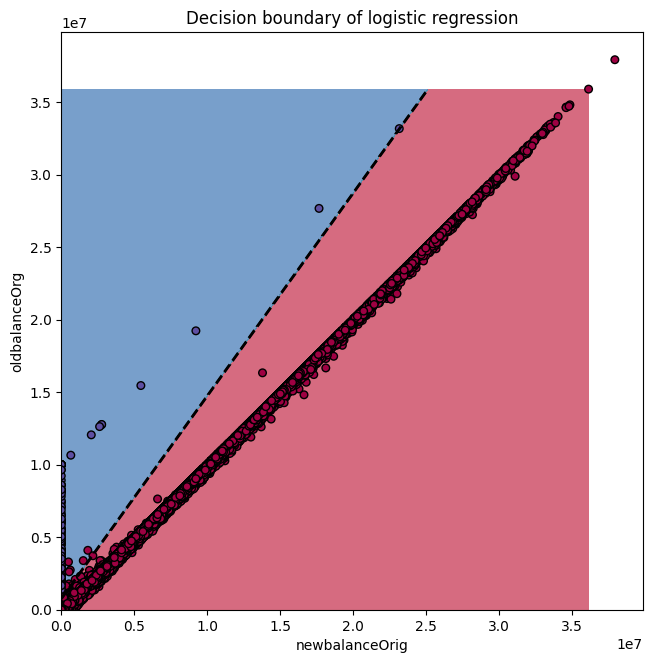

In [50]:
import matplotlib.pyplot as plt
import numpy as np

print(X_train.shape)
print(X_test.shape)

# Convert X_train and X_test DataFrames to NumPy arrays
X_train = X_train.values
X_test = X_test.values

# Define the meshgrid of the feature space
h = 7500
x_min, x_max = X_test[:, 0].min() - 0.5, X_test[:, 0].max() + 0.5
y_min, y_max = X_test[:, 1].min() - 0.5, X_test[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
X_mesh = np.c_[xx.ravel(), yy.ravel()]

# Predict classes for the feature space
Z = logreg.predict(X_mesh)

plt.figure(figsize=(7.5,7.5))

# Reshape the predictions and plot the decision boundary
Z = Z.reshape(xx.shape)
plt.contour(xx, yy, Z, levels=[0.5], colors='k', linestyles='dashed', linewidths=2)
plt.contourf(xx, yy, Z, cmap=plt.cm.Spectral, alpha=0.7)


# Plot the training and testing data
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.Spectral, edgecolor='black', s = 30 )
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.Spectral, edgecolor='black', s = 30)

plt.title("Decision boundary of logistic regression")
plt.xlabel("newbalanceOrig")
plt.ylabel("oldbalanceOrg")
plt.show()


# **KNN**

In [51]:
import warnings
warnings.filterwarnings("ignore", message="^Unlike other reduction functions")

# Initialize and fit KNN model
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(weights = 'uniform', n_neighbors = 9)
knn.fit(X_train, y_train)

# Predict classes for train and test sets
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

#Confusion matrix and classification report
cm = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix:')
print(cm)
print('-'*60)
print("Classification report:\n", classification_report(y_test, y_test_pred))

Training accuracy: 0.9991395833333333
Testing accuracy: 0.9990833333333333
Confusion Matrix:
[[119835     15]
 [    95     55]]
------------------------------------------------------------
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.79      0.37      0.50       150

    accuracy                           1.00    120000
   macro avg       0.89      0.68      0.75    120000
weighted avg       1.00      1.00      1.00    120000



Training accuracy: 0.9991395833333333
Testing accuracy: 0.9990833333333333
Confusion Matrix:
[[119835     15]
 [    95     55]]
------------------------------------------------------------
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.79      0.37      0.50       150

    accuracy                           1.00    120000
   macro avg       0.89      0.68      0.75    120000
weighted avg       1.00      1.00      1.00    120000



C:\Users\johna\myenv\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names



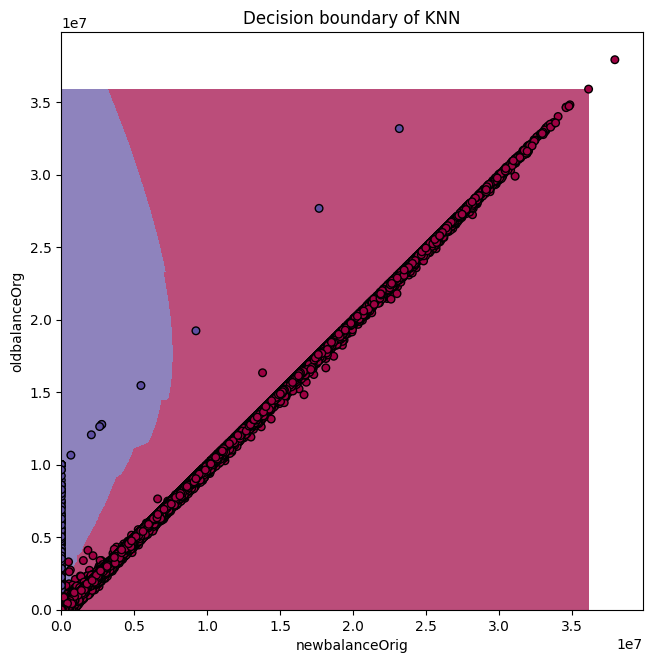

In [52]:
# Splitting data_train and data_test into features and lables
X_train = data_train[['newbalanceOrig','oldbalanceOrg']]
y_train = data_train['isFraud']
X_test = data_test[['newbalanceOrig','oldbalanceOrg']]
y_test =  data_test['isFraud']

import warnings
warnings.filterwarnings("ignore", message="^Unlike other reduction functions")

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import numpy as np

# Initialize and fit KNN model
knn = KNeighborsClassifier(weights = 'uniform', n_neighbors = 9)
knn.fit(X_train, y_train)

# Predict classes for train and test sets
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

#Confusion matrix and classification report
cm = confusion_matrix(y_test, y_test_pred)
print('Confusion Matrix:')
print(cm)
print('-'*60)
print("Classification report:\n", classification_report(y_test, y_test_pred))

X_test = X_test.values
X_train = X_train.values

# Define the meshgrid of the feature space
h = 10000
x_min, x_max = X_test[:, 0].min() - 0.5, X_test[:, 0].max() + 0.5
y_min, y_max = X_test[:, 1].min() - 0.5, X_test[:, 1].max() + 0.5
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
X_mesh = np.c_[xx.ravel(), yy.ravel()]

# Predict classes for the feature space
Z = knn.predict(X_mesh)

plt.figure(figsize=(7.5,7.5))

# Reshape the predictions and plot the decision boundary
Z = Z.reshape(xx.shape)
plt.pcolormesh(xx, yy, Z, cmap=plt.cm.Spectral, alpha=0.7)

# Plot the training and testing data
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.Spectral, edgecolors='k', s =30)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.Spectral, edgecolors='k', s = 30)

plt.title("Decision boundary of KNN")
plt.xlabel("newbalanceOrig")
plt.ylabel("oldbalanceOrg")
plt.show()

# **Decision Tree**

Training accuracy: 0.9992125
Testing accuracy: 0.9991
Confusion matrix:
 [[119840     10]
 [    98     52]]
Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.84      0.35      0.49       150

    accuracy                           1.00    120000
   macro avg       0.92      0.67      0.75    120000
weighted avg       1.00      1.00      1.00    120000



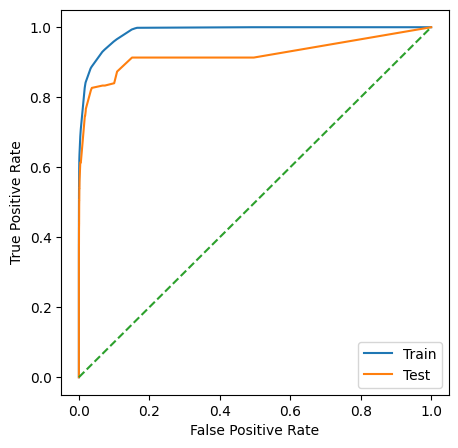

In [53]:
# Splitting data_train and data_test into features and lables
X_train = data_train[['newbalanceOrig','oldbalanceOrg']]
y_train = data_train['isFraud']
X_test = data_test[['newbalanceOrig','oldbalanceOrg']]
y_test =  data_test['isFraud']

import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve

# Re-train the dataset with the best hyperparameters
clf = DecisionTreeClassifier(min_samples_split= 2, min_samples_leaf= 2, max_depth= 10)
clf.fit(X_train, y_train)

# Predict the classes of test set
y_train_pred = clf.predict(X_train)
y_test_pred = clf.predict(X_test)
y_train_prob = clf.predict_proba(X_train)[:,1]
y_test_prob = clf.predict_proba(X_test)[:,1]

# Calculate training and testing accuracies
train_acc = accuracy_score(y_train, y_train_pred)
test_acc = accuracy_score(y_test, y_test_pred)
print('Training accuracy:', train_acc)
print('Testing accuracy:', test_acc)

# Generate classification report
cm = confusion_matrix(y_test, y_test_pred)
cr = classification_report(y_test, y_test_pred)
print('Confusion matrix:\n', cm)
print('Classification report:\n', cr)

# Plot ROC curve for train and test sets
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_train_prob)
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_test_prob)
plt.figure(figsize=(5,5))
plt.plot(fpr_train, tpr_train, label='Train')
plt.plot(fpr_test, tpr_test, label='Test')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

C:\Users\johna\myenv\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



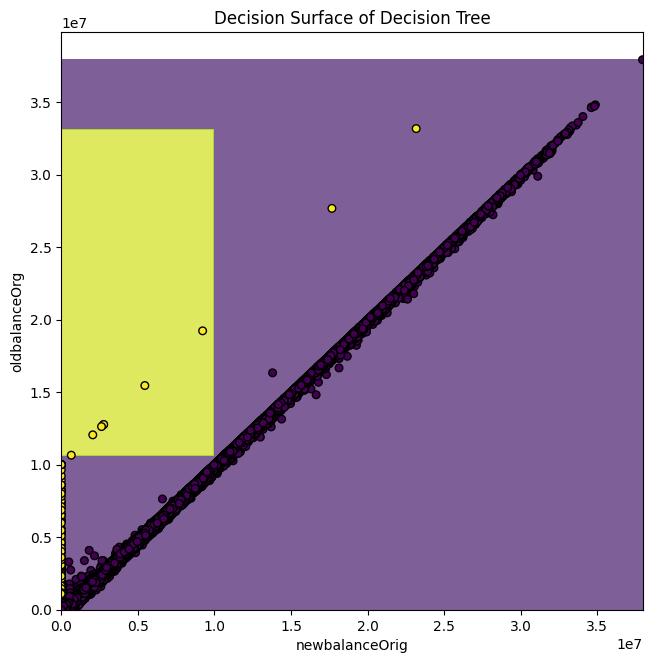

In [54]:
# Plot decision boundary
plt.figure(figsize=(7.5,7.5))
x_min, x_max = X_train.iloc[:, 0].min() - 0.1, X_train.iloc[:, 0].max() + 0.1
y_min, y_max = X_train.iloc[:, 1].min() - 0.1, X_train.iloc[:, 1].max() + 0.1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 10000),
                     np.arange(y_min, y_max, 10000))
Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, alpha=0.7) # increase alpha value to 0.7
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c=y_train, edgecolor='black', s = 30)
plt.xlabel("newbalanceOrig")
plt.ylabel("oldbalanceOrg")
plt.title('Decision Surface of Decision Tree')
plt.show()


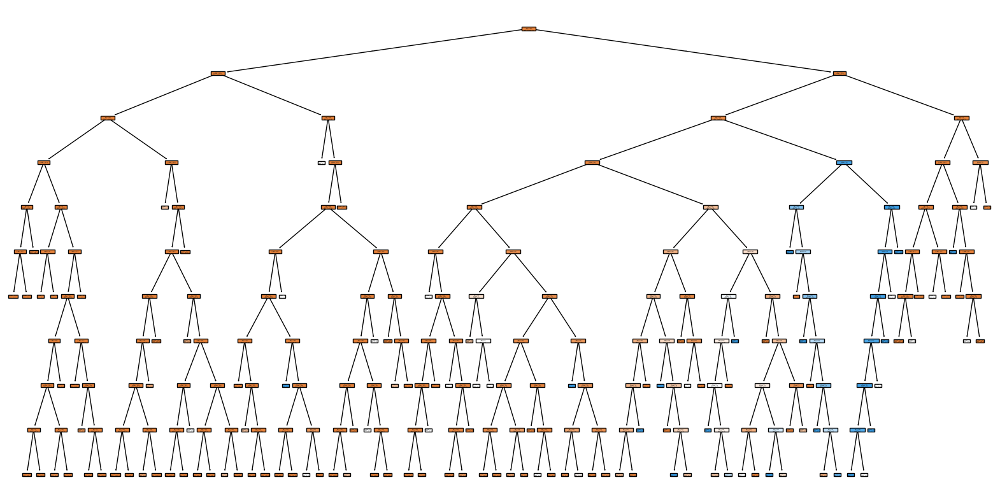

In [55]:
from sklearn.tree import plot_tree

plt.figure(figsize=(20,10))
plot_tree(clf, filled=True, feature_names=X_train.columns)
plt.show()


# Deep Learning 

In [56]:
# Import necessary libraries for deep learning, plotting, and evaluation
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np

In [57]:
# Define features and target variable (using numeric columns)
features = ['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest', 'newbalanceDest']
X = data[features]
y = data['isFraud']

# Split data into training and testing datasets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features to improve training performance
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build a simple feedforward neural network
model = Sequential([
    Dense(32, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')  # Sigmoid for binary classification
])

# Compile the model using binary crossentropy loss and Adam optimizer
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model using 10 epochs and a batch size of 256, with a validation split of 10%
history = model.fit(X_train_scaled, y_train, epochs=10, batch_size=256, validation_split=0.1)

C:\Users\johna\myenv\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 8s 2ms/step - accuracy: 0.9987 - loss: 0.0815 - val_accuracy: 0.9988 - val_loss: 0.0079
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9990 - loss: 0.0066 - val_accuracy: 0.9990 - val_loss: 0.0062
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9991 - loss: 0.0056 - val_accuracy: 0.9991 - val_loss: 0.0062
Epoch 4/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9991 - loss: 0.0050 - val_accuracy: 0.9992 - val_loss: 0.0049
Epoch 5/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9991 - loss: 0.0046 - val_accuracy: 0.9992 - val_loss: 0.0046
Epoch 6/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9992 - loss: 0.0048 - val_accuracy: 0.9992 - val_loss: 0.0041
Epoch 7/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9992 - loss: 0.0040 - val_accuracy: 0.9992 - val_loss: 0.0042
Epoch 8/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9992 - loss: 0.0043 - 

In [58]:
# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test_scaled, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

# Generate predictions on the test set and threshold them
y_pred = (model.predict(X_test_scaled) > 0.5).astype("int32")

# Print evaluation metrics
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

3750/3750 ━━━━━━━━━━━━━━━━━━━━ 5s 1ms/step - accuracy: 0.9994 - loss: 0.0034
Test Loss: 0.0038550382014364004
Test Accuracy: 0.9992666840553284
3750/3750 ━━━━━━━━━━━━━━━━━━━━ 3s 841us/step
Confusion Matrix:
[[119845      5]
 [    83     67]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    119850
           1       0.93      0.45      0.60       150

    accuracy                           1.00    120000
   macro avg       0.96      0.72      0.80    120000
weighted avg       1.00      1.00      1.00    120000



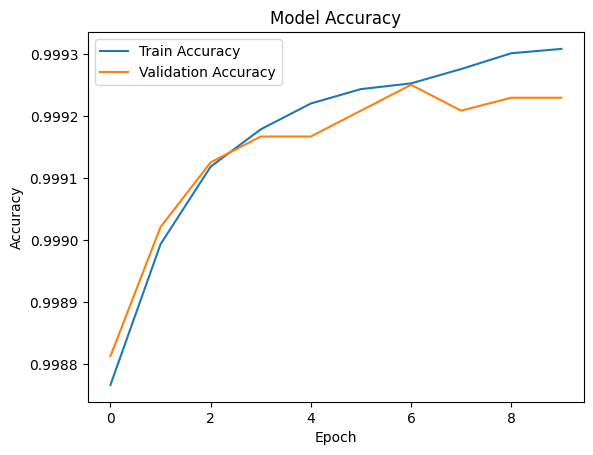

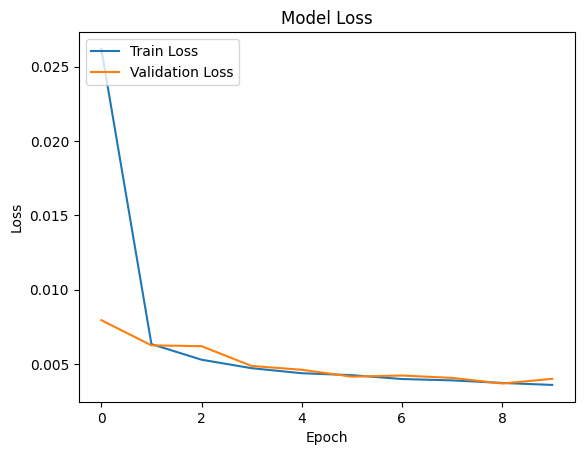

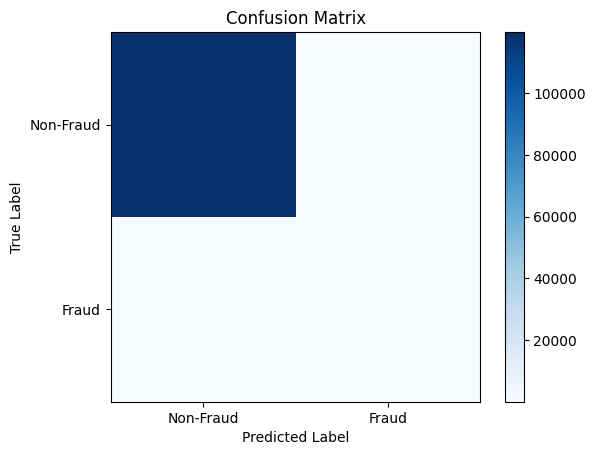

In [59]:
# Plot the training & validation accuracy over epochs
plt.figure()
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.show()

# Plot the training & validation loss over epochs
plt.figure()
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.show()

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Non-Fraud', 'Fraud'])
plt.yticks(tick_marks, ['Non-Fraud', 'Fraud'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

Trial 5 Complete [00h 13m 44s]
val_accuracy: 0.9991562366485596

Best val_accuracy So Far: 0.999343752861023
Total elapsed time: 01h 00m 03s
Optimal units in first layer: 48
Optimal number of additional layers: 2
Optimal learning rate: 0.001
Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9946 - loss: 0.0570 - val_accuracy: 0.9991 - val_loss: 0.0061
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9991 - loss: 0.0052 - val_accuracy: 0.9992 - val_loss: 0.0046
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9992 - loss: 0.0046 - val_accuracy: 0.9991 - val_loss: 0.0050
Epoch 4/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9992 - loss: 0.0043 - val_accuracy: 0.9992 - val_loss: 0.0045
Epoch 5/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9993 - loss: 0.0037 - val_accuracy: 0.9992 - val_loss: 0.0042
Epoch 6/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9993 - loss: 0.0038 - val_accuracy: 0.99

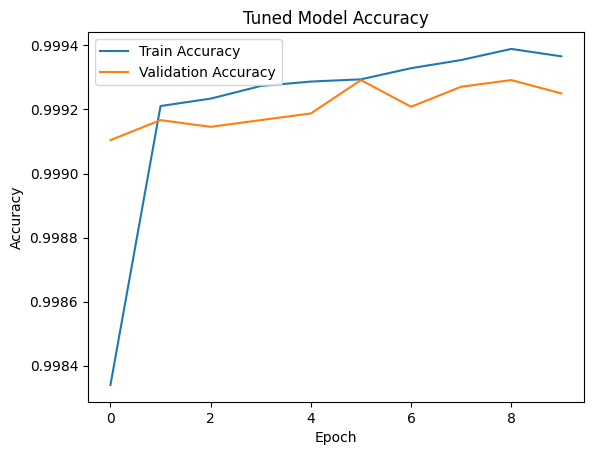

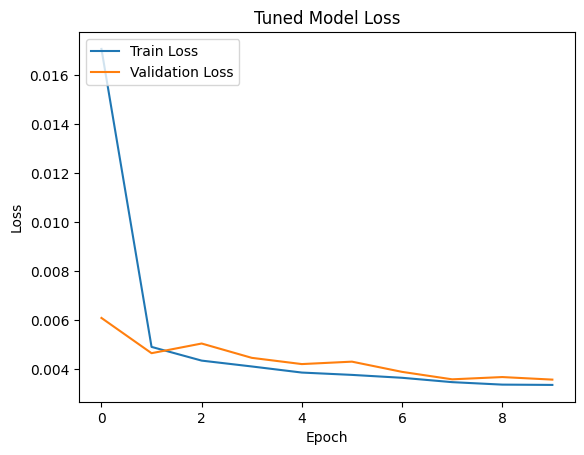

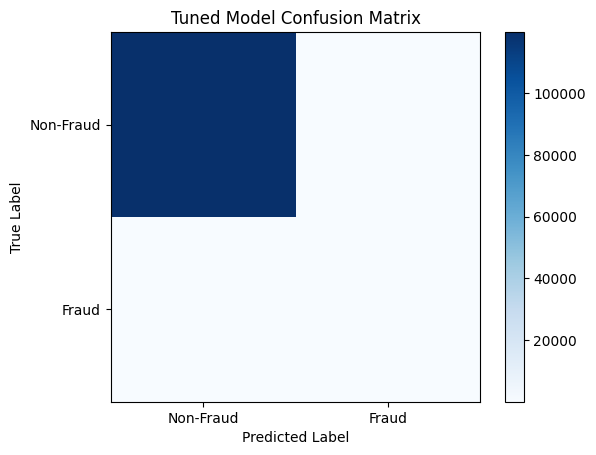

In [60]:
# Import necessary libraries for deep learning, tuning, plotting, and evaluation
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import keras_tuner as kt

# Define features and target variable (using numeric columns)
features = ['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest', 'newbalanceDest']
X = data[features]
y = data['isFraud']

# Split data into training and testing datasets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features to improve training performance
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define a model-building function for hyperparameter tuning
def build_model(hp):
    model = Sequential()
    # First hidden layer: Tune number of units between 16 and 64 (step size 16)
    units = hp.Int('units_1', min_value=16, max_value=64, step=16)
    model.add(Dense(units=units, activation='relu', input_shape=(X_train_scaled.shape[1],)))
    
    # Add 1 to 3 additional hidden layers
    for i in range(hp.Int('num_layers', 1, 3)):
        units = hp.Int(f'units_{i+2}', min_value=16, max_value=64, step=16)
        model.add(Dense(units=units, activation='relu'))
        # Optionally include dropout after each additional layer
        if hp.Boolean(f'dropout_{i+1}'):
            dropout_rate = hp.Float(f'dropout_rate_{i+1}', min_value=0.2, max_value=0.5, step=0.1)
            model.add(Dropout(rate=dropout_rate))
    
    # Output layer for binary classification
    model.add(Dense(1, activation='sigmoid'))
    
    # Tune learning rate for the Adam optimizer
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])
    return model

# Set up the RandomSearch tuner
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=5,            # Increase this value for a more thorough search
    executions_per_trial=2,  # Number of models built for each set of hyperparameters
    directory='my_dir',
    project_name='fraud_detection_tuning'
)

# Perform the search for the best hyperparameters
tuner.search(X_train_scaled, y_train, epochs=10, validation_split=0.1)

# Retrieve the best hyperparameters found
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Optimal units in first layer:", best_hps.get('units_1'))
print("Optimal number of additional layers:", best_hps.get('num_layers'))
print("Optimal learning rate:", best_hps.get('learning_rate'))

# Build and train the best model using the optimal hyperparameters
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train_scaled, y_train, epochs=10, batch_size=256, validation_split=0.1)

# Evaluate the tuned model on the test set
loss, accuracy = model.evaluate(X_test_scaled, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

# Generate predictions on the test set and threshold them
y_pred = (model.predict(X_test_scaled) > 0.5).astype("int32")

# Print evaluation metrics
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Plot training & validation accuracy over epochs
plt.figure()
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Tuned Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.show()

# Plot training & validation loss over epochs
plt.figure()
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Tuned Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.show()

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Tuned Model Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Non-Fraud', 'Fraud'])
plt.yticks(tick_marks, ['Non-Fraud', 'Fraud'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


In [1]:
# Splitting data_train and data_test into features and lables
X_train = data_train.drop('isFraud', axis = 1)
y_train = data_train['isFraud']
X_test = data_test.drop('isFraud', axis = 1)
y_test =  data_test['isFraud']

NameError: name 'data_train' is not defined